<a href="https://colab.research.google.com/github/magenta/music-spectrogram-diffusion/blob/main/music_spectrogram_diffusion/colab/synthesize_midi.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Multi-instrument Music Synthesis with Spectrogram Diffusion

This notebook is an interactive demo of a [music synthesis model](https://github.com/magenta/music-spectrogram-diffusion) created by Google's [Magenta](https://g.co/magenta) team.  You can upload a MIDI file and have the model render it as audio.

<img src="https://storage.googleapis.com/music-synthesis-with-spectrogram-diffusion/architecture.png" alt="Architecture diagram">


For more information:

* [ISMIR 2022 paper](https://arxiv.org/abs/2206.05408) on arXiv
* [Online Supplement](https://storage.googleapis.com/music-synthesis-with-spectrogram-diffusion/index.html) with audio examples
* [Code on GitHub](https://github.com/magenta/music-spectrogram-diffusion)

**Caveat**: The TPUs provided by Colab are significantly slower than the ones used in the paper, so the `base_with_context` model will render about 5x slower than realtime.  For results similar to the realtime speeds described in the paper, a TPUv4 accelerator is required.

We hope you have fun synthesizing!  Feel free to tweet any interesting output at [@GoogleMagenta](https://twitter.com/googlemagenta)!

### Instructions for running:

* Make sure to use a TPU runtime, click:  __Runtime >> Change Runtime Type >> TPU__
* Press ▶️ on the left of each cell to execute the cell, or use __Runtime >> Run all__
* In the __Upload MIDI File__ cell, choose a MIDI file from your computer when prompted
* Synthesize the audio using the __Synthesize Audio__ cell


In [1]:
# Copyright 2022 Google LLC. All Rights Reserved.

# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at

#     http://www.apache.org/licenses/LICENSE-2.0

# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.
# ==============================================================================

#@title Setup Environment
#@markdown Install *Multi-instrument Music Synthesis with Spectrogram Diffusion* and its dependencies (may take a few minutes).

!apt-get update -qq && apt-get install -qq libfluidsynth1 build-essential libasound2-dev libjack-dev

!pip install nest-asyncio
!pip install pyfluidsynth
# pin CLU for python 3.7 compatibility
!pip install clu==0.0.7
# pin Orbax to use Checkpointer
!pip install orbax==0.0.2

!pip install note_seq==0.0.3

# install t5x
!rm -r t5x
!git clone --branch=main https://github.com/google-research/t5x
# pin T5X for python 3.7 compatibility
!cd t5x; git reset --hard 2e05ad41778c25521738418de805757bf2e41e9e; cd ..
!mv t5x t5x_tmp; mv t5x_tmp/* .; rm -r t5x_tmp
!sed -i 's:jax\[tpu\]:jax:' setup.py
!python3 -m pip install -e .

# install mt3
!rm -r mt3
!git clone --branch=main https://github.com/magenta/mt3
!mv mt3 mt3_tmp; mv mt3_tmp/* .; rm -r mt3_tmp
!python3 -m pip install -e .

# Latest JAX has XLA compilation issues with our setup.
!pip install jax==0.3.16

# Latest pyfluidsynth doesn't work correctly with pretty_midi synthesis.
!pip install pyfluidsynth==1.3.0

# install music_spectrogram_diffusion
!rm -r music_spectrogram_diffusion
!git clone --branch=main https://github.com/magenta/music-spectrogram-diffusion
!mv music-spectrogram-diffusion/* .; rm -r music-spectrogram-diffusion
!python3 -m pip install -e .

# copy soundfont (originally from https://sites.google.com/site/soundfonts4u)
!gsutil -q -m cp gs://magentadata/soundfonts/SGM-v2.01-Sal-Guit-Bass-V1.3.sf2 .

Selecting previously unselected package libfluidsynth1:amd64.
(Reading database ... 123934 files and directories currently installed.)
Preparing to unpack .../libfluidsynth1_1.1.9-1_amd64.deb ...
Unpacking libfluidsynth1:amd64 (1.1.9-1) ...
Setting up libfluidsynth1:amd64 (1.1.9-1) ...
Processing triggers for libc-bin (2.27-3ubuntu1.6) ...
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 92 kB 610 kB/s 
     |████████████████████████████████| 185 kB 39.4 MB/s 
     |████████████████████████████████| 77 kB 6.9 MB/s 
     |████████████████████████████████| 237 kB 44.9 MB/s 
     |████████████████████████████████| 145 kB 44.8 MB/s 
     |████████████████████████████████| 51 kB 5.9 MB/s 
     |█████████████

In [3]:
#@title Imports and Definitions

import nest_asyncio
nest_asyncio.apply()

import jax.tools.colab_tpu
# Workaround for https://github.com/googlecolab/colabtools/issues/3009
jax.tools.colab_tpu.setup_tpu(tpu_driver_version='tpu_driver-0.1dev20220801')

import functools
import os

import gin
import jax
import numpy as np
import jax.numpy as jnp
import tensorflow as tf

import librosa
import note_seq

# TensorFlow shouldn't use the GPU or TPU.
tf.config.set_visible_devices([], "GPU")
tf.config.set_visible_devices([], "TPU")

# Should show that JAX can see the GPU/TPU.
# jax.devices()

# We're pinning T5X at an old version for Python 3.7 compatibility,
# but the old version hasn't been updated to the JAX API changes around
# tree_multimap, so manually patch in these aliases as a workaround.
jax.tree_util.tree_multimap = jax.tree_util.tree_map
jax.tree_multimap = jax.tree_util.tree_multimap

from music_spectrogram_diffusion.models.diffusion import models
from music_spectrogram_diffusion.models.diffusion import network
from music_spectrogram_diffusion.models.diffusion import feature_converters
from music_spectrogram_diffusion import datasets
from music_spectrogram_diffusion import inference
from music_spectrogram_diffusion import metrics
from music_spectrogram_diffusion import note_sequences
from music_spectrogram_diffusion import preprocessors
from music_spectrogram_diffusion import run_length_encoding
from music_spectrogram_diffusion import audio_codecs
from music_spectrogram_diffusion import tasks
from music_spectrogram_diffusion import vocabularies

import seqio
import t5
import t5x
import t5x.partitioning

from t5x import adafactor
from t5x import adafactor
from t5x import gin_utils
from t5x import partitioning
from t5x import trainer
from t5x import utils

from google.colab import files

import matplotlib.pyplot as plt
import IPython

SAMPLE_RATE = 16000
SF2_PATH = 'SGM-v2.01-Sal-Guit-Bass-V1.3.sf2'

def upload_midi():
  data = list(files.upload().values())
  if len(data) > 1:
    print('Multiple files uploaded; using only one.')
  return note_seq.midi_to_note_sequence(data[0])

AttributeError: ignored

In [ ]:
#@title Load Model

#@markdown The `base_with_context` model results in the best audio quality.

MODEL = 'base_with_context'  #@param['base_with_context', 'small_with_context']

!gsutil -q -m cp gs://music-synthesis-with-spectrogram-diffusion/checkpoints/{MODEL}.zip .
!unzip -o '*.zip'

checkpoint_path = f'{MODEL}/checkpoint_500000'

In [ ]:
#@title Restore Model

gin_overrides = [
    "from __gin__ import dynamic_registration",
    "from music_spectrogram_diffusion.models.diffusion import diffusion_utils",
    "diffusion_utils.ClassifierFreeGuidanceConfig.eval_condition_weight = 2.0",
    "diffusion_utils.DiffusionConfig.classifier_free_guidance = @diffusion_utils.ClassifierFreeGuidanceConfig()"
]

gin_file = os.path.join(checkpoint_path, '..', 'config.gin')
gin_config = inference.parse_training_gin_file(gin_file, gin_overrides)
synth_model = inference.InferenceModel(checkpoint_path, gin_config)

# Workaround for pjit not working on colab.
# https://github.com/google/jax/issues/8300
def fake_partition( self,
      fn,
      in_axis_resources,
      out_axis_resources,
      static_argnums = (),
      donate_argnums = (),
  ) -> t5x.partitioning.PjittedFnWithContext:
  # Just use jit instead of pjit. We don't need the parallelism on colab anyway.
  pjitted = jax.jit(
      fn, static_argnums=static_argnums, donate_argnums=donate_argnums)
  return t5x.partitioning.PjittedFnWithContext(pjitted, self.mesh)

synth_model.partitioner.partition = fake_partition.__get__(
    synth_model.partitioner, t5x.partitioning.PjitPartitioner)

In [ ]:
#@title Upload MIDI File

#@markdown As a baseline, this cell will render the MIDI file using FluidSynth.

ns = upload_midi()

note_seq.play_sequence(
    ns, synth=note_seq.midi_synth.fluidsynth, sf2_path=SF2_PATH,
    sample_rate=SAMPLE_RATE)
note_seq.plot_sequence(ns)

Saving beethoven_piano_trio_38_1_(c)iscenko (1).mid to beethoven_piano_trio_38_1_(c)iscenko (1).mid


In [ ]:
#@title Setup Synthesis Task

vocabulary = vocabularies.vocabulary_from_codec(synth_model.codec)
note_representation_config = tasks.NoteRepresentationConfig(
          onsets_only=False, include_ties=True)

# TODO(iansimon): add this to preprocessors.py once it's less hacky
def program_to_slakh_program(program):
  # this is done very hackily, probably should use a custom mapping
  for slakh_program in sorted(preprocessors._SLAKH_CLASS_PROGRAMS.values(),
                              reverse=True):
    if program >= slakh_program:
      return slakh_program

def create_dataset(split, shuffle_files):
  del split
  del shuffle_files
  ns_sus = note_seq.apply_sustain_control_changes(ns)
  for note in ns_sus.notes:
    if not note.is_drum:
      note.program = program_to_slakh_program(note.program)
  samples = np.zeros(
      int(ns_sus.total_time * synth_model.audio_codec.sample_rate))  
  frames, frame_times = preprocessors._audio_to_frames(
      samples,
      synth_model.audio_codec.hop_size,
      synth_model.audio_codec.frame_rate)
  times, values = (
      note_sequences.note_sequence_to_onsets_and_offsets_and_programs(ns_sus))
  (events, event_start_indices, event_end_indices,
   state_events, state_event_indices) = (
       run_length_encoding.encode_and_index_events(
           state=note_sequences.NoteEncodingState(),
           event_times=times,
           event_values=values,
           encode_event_fn=note_sequences.note_event_data_to_events,
           codec=synth_model.codec,
           frame_times=frame_times,
           encoding_state_to_events_fn=(
               note_sequences.note_encoding_state_to_events)))
  return tf.data.Dataset.from_tensors({
        'inputs': frames,
        'input_times': frame_times.astype(np.float32),
        'targets': events.astype(np.int32),
        'event_start_indices': event_start_indices.astype(np.int32),
        'event_end_indices': event_end_indices.astype(np.int32),
        'state_events': state_events.astype(np.int32),
        'state_event_indices': state_event_indices.astype(np.int32),
        'sequence': ns_sus.SerializeToString()
  })

infer_task = seqio.Task(
    name='infer_full_song',
    source=seqio.FunctionDataSource(
        create_dataset,
        splits=['eval'],
        num_input_examples={'eval': 1}),
    output_features={
        'inputs': seqio.Feature(vocabulary=vocabulary),
        'targets': seqio.ContinuousFeature(dtype=tf.float32, rank=2),
        'targets_context': seqio.ContinuousFeature(dtype=tf.float32, rank=2),
    },
    # just take one sequence
    preprocessors=tasks.pre_cache_processor_chain(
        audio_codec=synth_model.audio_codec,
        codec=synth_model.codec,
        tokenize_fn=lambda ds, **kwargs: ds,
        note_representation_config=note_representation_config,
        split_sequences=False
    ) + tasks.split_full_song_processor_chain(
            audio_codec=synth_model.audio_codec,
            feature_context_key='targets_context'
    ) + tasks.note_representation_processor_chain(
            codec=synth_model.codec,
            note_representation_config=note_representation_config
    ) + [
        functools.partial(
            preprocessors.encode_audio,
            targets_keys=['targets'],
            context_keys=['targets_context'],
            keys_to_pad=None,
            audio_codec=synth_model.audio_codec),
        functools.partial(preprocessors.handle_too_long, skip=False),
        functools.partial(
            seqio.preprocessors.tokenize_and_append_eos,
            copy_pretokenized=True)
    ])

infer_ds = infer_task.get_dataset(
    sequence_length=synth_model.sequence_length,
    split='eval',
    use_cached=False, shuffle=False)

infer_ds_raw_batches = infer_ds.batch(1)
infer_ds_feats = synth_model.model.FEATURE_CONVERTER_CLS(pack=False)(
    infer_ds, synth_model.sequence_length)
infer_ds_batches = infer_ds_feats.batch(1)


Generated segment 1
Generated segment 2
Generated segment 3
Generated segment 4
Generated segment 5
Generated segment 6
Generated segment 7
Generated segment 8
Generated segment 9
Generated segment 10
Generated segment 11
Generated segment 12
Generated segment 13
Generated segment 14
Generated segment 15
Generated segment 16
Generated segment 17
Generated segment 18
Generated segment 19
Generated segment 20
Generated segment 21
Generated segment 22
Generated segment 23
Generated segment 24
Generated segment 25
Generated segment 26
Generated segment 27
Generated segment 28
Generated segment 29
Generated segment 30
Generated segment 31
Generated segment 32
Generated segment 33
Generated segment 34
Generated segment 35
Generated segment 36
Generated segment 37
Generated segment 38
Generated segment 39
Generated segment 40
Generated segment 41
Generated segment 42
Generated segment 43
Generated segment 44
Generated segment 45
Generated segment 46
Generated segment 47
Generated segment 48
G

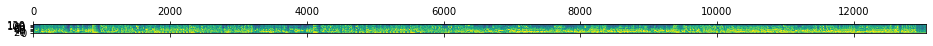

In [ ]:
#@title Synthesize Audio
#@markdown The audio will be synthesized in segments of length 5.12 seconds each.
#@markdown When synthesis is complete the audio may be played back or downloaded.

# Initialize previous prediction to zeros.
# We'll zero out the mask for the first prediction, so the value here doesn't
# matter.
pred_mel = np.zeros([1, synth_model.sequence_length['targets_context'],
                     synth_model.audio_codec.n_dims])

# Variables for accumulating the full song prediction.
full_pred_mel = np.zeros([1, 0, synth_model.audio_codec.n_dims], np.float32)

# Iterators over the dataset.
infer_ds_batches_iter = infer_ds_batches.as_numpy_iterator()

i = 0
while True:
  try:
    batch = next(infer_ds_batches_iter)
    # TODO(fjord): put the first-chunk logic into a library function
    batch['encoder_continuous_inputs'] = pred_mel[:1]
    if i == 0:
      # The first chunk has no previous context.
      batch['encoder_continuous_mask'] = np.zeros_like(
          batch['encoder_continuous_mask'])
    else:
      # The full song pipeline does not feed in a context feature, so the mask
      # will be all 0s after the feature converter. Because we know we're
      # feeding in a full context chunk from the previous prediction, set it
      # to all 1s.
      batch['encoder_continuous_mask'] = np.ones_like(
          batch['encoder_continuous_mask'])
    pred_mel, scores = synth_model.predict(batch)
    full_pred_mel = np.concatenate([full_pred_mel, pred_mel[:1]], axis=1)
    i += 1
    print('Generated segment', i)
  except StopIteration:
    break

full_pred_audio = synth_model.audio_codec.decode(full_pred_mel)

plt.matshow(np.flipud(np.rot90(full_pred_mel[0])), origin='lower')
IPython.display.Audio(full_pred_audio, rate=SAMPLE_RATE)